In [2]:
using DataFrames, Chain, Statistics, CSV, StatsPlots

In [3]:
census_data = CSV.read("Gaz_ua_national.csv",DataFrame)

Row,GEOID,NAME,UATYPE,POP10,HU10,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
,Int64,String,String1,Int64,Int64,Int64,Int64,Float64,Float64,Float64,Float64
1,37,"Abbeville, LA Urban Cluster",C,19824,8460,29222871,300497,11.283,0.116,29.9676,-92.0982
2,64,"Abbeville, SC Urban Cluster",C,5243,2578,11315197,19786,4.369,0.008,34.1792,-82.3797
3,91,"Abbotsford, WI Urban Cluster",C,3966,1616,5363441,13221,2.071,0.005,44.9486,-90.3159
4,118,"Aberdeen, MS Urban Cluster",C,4666,2050,7416616,52732,2.864,0.02,33.8247,-88.5546
5,145,"Aberdeen, SD Urban Cluster",C,25977,12114,33002447,247597,12.742,0.096,45.4632,-98.471
6,172,"Aberdeen, WA Urban Cluster",C,29856,13139,39997951,1929689,15.443,0.745,46.9764,-123.796
7,199,"Aberdeen--Bel Air South--Bel Air North, MD Urbanized Area",U,213751,83721,339626464,9825290,131.131,3.794,39.509,-76.3034
8,226,"Abernathy, TX Urban Cluster",C,2785,1124,3051109,12572,1.178,0.005,33.8305,-101.846
9,253,"Abilene, KS Urban Cluster",C,7054,3238,8773263,1877,3.387,0.001,38.9211,-97.2208


In [4]:
@chain census_data begin
  select(:GEOID, :NAME, :POP10)
  sort(:POP10, rev = true)
  first(10)
end

Row,GEOID,NAME,POP10
,Int64,String,Int64
1,63217,"New York--Newark, NY--NJ--CT Urbanized Area",18351295
2,51445,"Los Angeles--Long Beach--Anaheim, CA Urbanized Area",12150996
3,16264,"Chicago, IL--IN Urbanized Area",8608208
4,56602,"Miami, FL Urbanized Area",5502379
5,69076,"Philadelphia, PA--NJ--DE--MD Urbanized Area",5441567
6,22042,"Dallas--Fort Worth--Arlington, TX Urbanized Area",5121892
7,40429,"Houston, TX Urbanized Area",4944332
8,92242,"Washington, DC--VA--MD Urbanized Area",4586770
9,3817,"Atlanta, GA Urbanized Area",4515419


In [5]:
@chain census_data begin
  subset(:INTPTLONG => long -> long .< -120)
  combine(:POP10 => sum)
end

Row,POP10_sum
,Int64
1,21932350


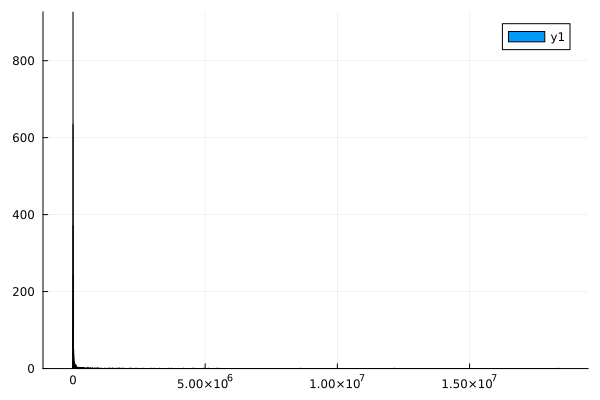

In [6]:
@df census_data histogram(:POP10)

In [7]:
savefig("../assets/plots/census/hist01.png")

"/Users/pstaab/code/sci-comp-book/assets/plots/census/hist01.png"

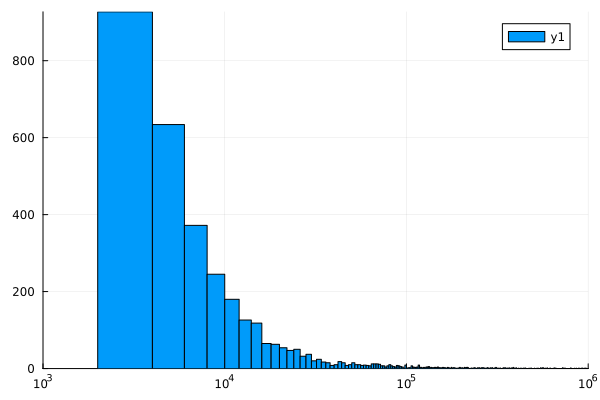

In [8]:
@df census_data histogram(:POP10, xscale = :log10, xlims = (10^3,10^6))

In [9]:
savefig("../assets/plots/census/hist02.png")

"/Users/pstaab/code/sci-comp-book/assets/plots/census/hist02.png"

In [10]:
sum(census_data.POP10)

252746527

In [11]:
@chain census_data begin
  transform( [:POP10, :HU10] => ((p,h)-> p./h) => :Housing_Density)
  select(:NAME, :Housing_Density)
  sort(:Housing_Density, rev=true)
  first(10)
end

Row,NAME,Housing_Density
,String,Float64
1,"Air Force Academy, CO Urban Cluster",16.908
2,"Colorado City, AZ--UT Urban Cluster",8.1839
3,"Kinross, MI Urban Cluster",6.75773
4,"Soledad, CA Urban Cluster",6.61642
5,"Alfred, NY Urban Cluster",6.55842
6,"Avenal, CA Urban Cluster",6.44713
7,"Corcoran, CA Urban Cluster",6.12188
8,"Montgomery, PA Urban Cluster",5.83454
9,"Darbydale, OH Urban Cluster",5.6216


In [12]:
@chain census_data begin
  combine(:HU10 => sum)
end

Row,HU10_sum
,Int64
1,105549535


In [13]:
@chain census_data begin
  select(:NAME, :ALAND)
  sort(:ALAND, rev=true)
  first(10)
end

Row,NAME,ALAND
,String,Int64
1,"New York--Newark, NY--NJ--CT Urbanized Area",8935981360
2,"Atlanta, GA Urbanized Area",6851428985
3,"Chicago, IL--IN Urbanized Area",6326686332
4,"Philadelphia, PA--NJ--DE--MD Urbanized Area",5131721516
5,"Boston, MA--NH--RI Urbanized Area",4852227548
6,"Dallas--Fort Worth--Arlington, TX Urbanized Area",4607936452
7,"Los Angeles--Long Beach--Anaheim, CA Urbanized Area",4496266014
8,"Houston, TX Urbanized Area",4299420988
9,"Detroit, MI Urbanized Area",3463234750


In [14]:
@chain census_data begin
  select(:NAME, :AWATER)
  sort(:AWATER, rev=true)
  first(10)
end

Row,NAME,AWATER
,String,Int64
1,"New York--Newark, NY--NJ--CT Urbanized Area",533176599
2,"Minneapolis--St. Paul, MN--WI Urbanized Area",232127029
3,"Tampa--St. Petersburg, FL Urbanized Area",211394181
4,"Boston, MA--NH--RI Urbanized Area",201870511
5,"Jacksonville, FL Urbanized Area",199369291
6,"Miami, FL Urbanized Area",191964476
7,"Virginia Beach, VA Urbanized Area",189979138
8,"Seattle, WA Urbanized Area",173839079
9,"Orlando, FL Urbanized Area",142321970


In [15]:
@chain census_data begin
  subset(:NAME => (n -> occursin.("MA",n)))
  combine(:POP10 => sum)
end

Row,POP10_sum
,Int64
1,7388152


In [18]:
@chain census_data begin
  subset(:NAME => n -> occursin.("MA",n))
  combine(:POP10 => mean, :POP10 => median, :POP10 => std)
end

Row,POP10_mean,POP10_median,POP10_std
,Float64,Float64,Float64
1,3.69408e5,20717.5,9.44398e5
